In [40]:
import os
import numpy as np
import matplotlib.pyplot as plt
import warnings
from tqdm.notebook import tqdm

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.preprocessing.image import load_img, array_to_img
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras import layers
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import BinaryCrossentropy
from tensorflow.keras.models import load_model

warnings.filterwarnings('ignore')

In [27]:
BASE_DIR = "Data_anime/data/"
# load complete image paths to the list
image_paths = []
for image_name in os.listdir(BASE_DIR):
    image_path = os.path.join(BASE_DIR, image_name)
    image_paths.append(image_path)

In [28]:
image_paths.remove("Data_anime/data/data")
len(image_paths)

21551

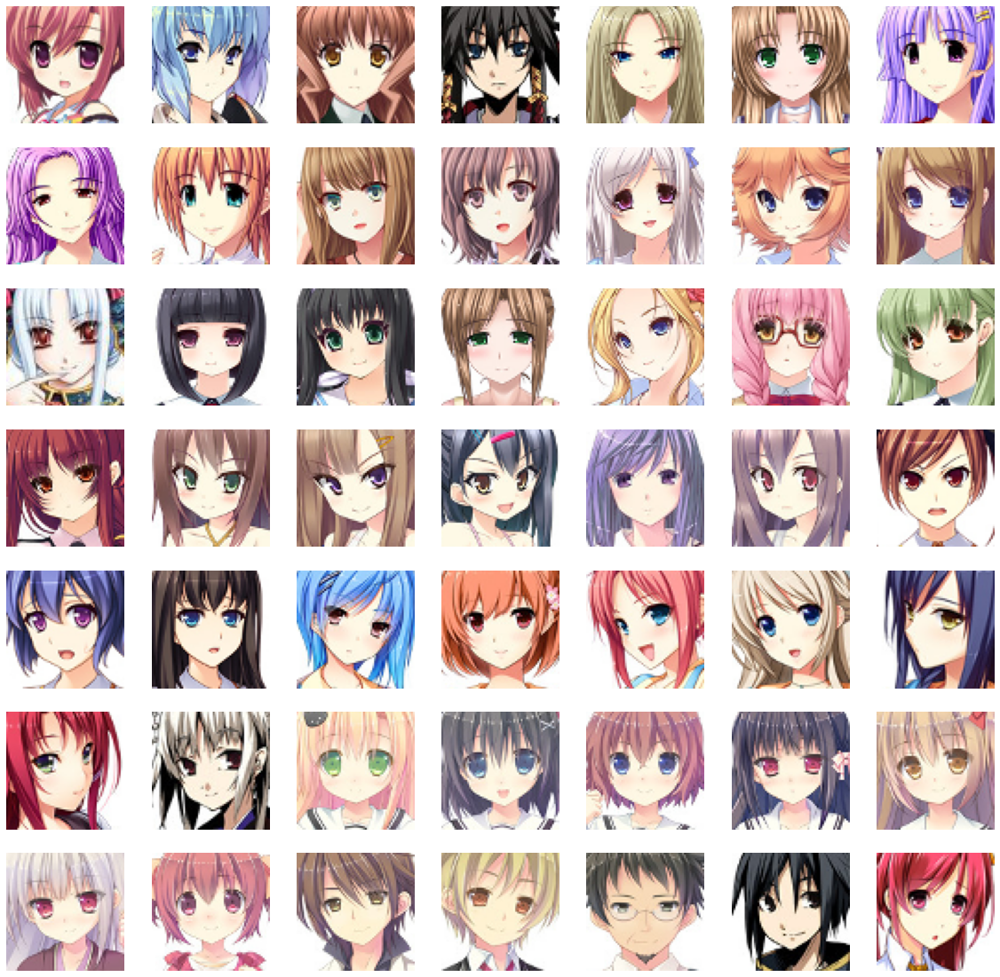

In [30]:
# to display grid of images (7x7)
plt.figure(figsize=(20, 20))
temp_images = image_paths[:49]
index = 1

for image_path in temp_images:
    plt.subplot(7, 7, index)
    # load the image
    img = load_img(image_path)
    # convert to numpy array
    img = np.array(img)
    # show the image
    plt.imshow(img)
    plt.axis('off')
    # increment the index for next image
    index += 1

In [31]:
image_paths[:5]

['Data_anime/data/1.png',
 'Data_anime/data/10.png',
 'Data_anime/data/100.png',
 'Data_anime/data/1000.png',
 'Data_anime/data/10000.png']

In [32]:
# load the image and convert to numpy array
train_images = [np.array(load_img(path)) for path in tqdm(image_paths)]
train_images = np.array(train_images)

  0%|          | 0/21551 [00:00<?, ?it/s]

In [33]:
train_images[0].shape

(64, 64, 3)

In [34]:
# reshape the array
train_images = train_images.reshape(train_images.shape[0], 64, 64, 3).astype('float32')
# normalize the images
train_images = (train_images - 127.5) / 127.5

In [17]:
# latent dimension for random noise
LATENT_DIM = 100
# weight initializer
WEIGHT_INIT = keras.initializers.RandomNormal(mean=0.0, stddev=0.02)
# no. of channels of the image
CHANNELS = 3 # for gray scale, keep it as 1

In [18]:
model = Sequential(name='generator')

# 1d random noise
model.add(layers.Dense(8 * 8 * 512, input_dim=LATENT_DIM))
# model.add(layers.BatchNormalization())
model.add(layers.ReLU())

# convert 1d to 3d
model.add(layers.Reshape((8, 8, 512)))

# upsample to 16x16
model.add(layers.Conv2DTranspose(256, (4, 4), strides=(2, 2), padding='same', kernel_initializer=WEIGHT_INIT))
# model.add(layers.BatchNormalization())
model.add(layers.ReLU())

# upsample to 32x32
model.add(layers.Conv2DTranspose(128, (4, 4), strides=(2, 2), padding='same', kernel_initializer=WEIGHT_INIT))
# model.add(layers.BatchNormalization())
model.add(layers.ReLU())

# upsample to 64x64
model.add(layers.Conv2DTranspose(64, (4, 4), strides=(2, 2), padding='same', kernel_initializer=WEIGHT_INIT))
# model.add(layers.BatchNormalization())
model.add(layers.ReLU())

model.add(layers.Conv2D(CHANNELS, (4, 4), padding='same', activation='tanh'))

generator = model
generator.summary()

2023-07-20 11:54:30.563066: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:982] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2023-07-20 11:54:30.564541: W tensorflow/core/common_runtime/gpu/gpu_device.cc:1956] Cannot dlopen some GPU libraries. Please make sure the missing libraries mentioned above are installed properly if you would like to use GPU. Follow the guide at https://www.tensorflow.org/install/gpu for how to download and setup the required libraries for your platform.
Skipping registering GPU devices...


Model: "generator"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 32768)             3309568   
                                                                 
 re_lu (ReLU)                (None, 32768)             0         
                                                                 
 reshape (Reshape)           (None, 8, 8, 512)         0         
                                                                 
 conv2d_transpose (Conv2DTra  (None, 16, 16, 256)      2097408   
 nspose)                                                         
                                                                 
 re_lu_1 (ReLU)              (None, 16, 16, 256)       0         
                                                                 
 conv2d_transpose_1 (Conv2DT  (None, 32, 32, 128)      524416    
 ranspose)                                               

In [19]:
model = Sequential(name='discriminator')
input_shape = (64, 64, 3)
alpha = 0.2

# create conv layers
model.add(layers.Conv2D(64, (4, 4), strides=(2, 2), padding='same', input_shape=input_shape))
model.add(layers.BatchNormalization())
model.add(layers.LeakyReLU(alpha=alpha))

model.add(layers.Conv2D(128, (4, 4), strides=(2, 2), padding='same', input_shape=input_shape))
model.add(layers.BatchNormalization())
model.add(layers.LeakyReLU(alpha=alpha))

model.add(layers.Conv2D(128, (4, 4), strides=(2, 2), padding='same', input_shape=input_shape))
model.add(layers.BatchNormalization())
model.add(layers.LeakyReLU(alpha=alpha))

model.add(layers.Flatten())
model.add(layers.Dropout(0.3))

# output class
model.add(layers.Dense(1, activation='sigmoid'))

discriminator = model
discriminator.summary()

Model: "discriminator"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_1 (Conv2D)           (None, 32, 32, 64)        3136      
                                                                 
 batch_normalization (BatchN  (None, 32, 32, 64)       256       
 ormalization)                                                   
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 32, 32, 64)        0         
                                                                 
 conv2d_2 (Conv2D)           (None, 16, 16, 128)       131200    
                                                                 
 batch_normalization_1 (Batc  (None, 16, 16, 128)      512       
 hNormalization)                                                 
                                                                 
 leaky_re_lu_1 (LeakyReLU)   (None, 16, 16, 128)     

In [20]:
class DCGAN(keras.Model):
    def __init__(self, generator, discriminator, latent_dim):
        super().__init__()
        self.generator = generator
        self.discriminator = discriminator
        self.latent_dim = latent_dim
        self.g_loss_metric = keras.metrics.Mean(name='g_loss')
        self.d_loss_metric = keras.metrics.Mean(name='d_loss')
        
    @property
    def metrics(self):
        return [self.g_loss_metric, self.d_loss_metric]
    
    def compile(self, g_optimizer, d_optimizer, loss_fn):
        super(DCGAN, self).compile()
        self.g_optimizer = g_optimizer
        self.d_optimizer = d_optimizer
        self.loss_fn = loss_fn
        
    def train_step(self, real_images):
        # get batch size from the data
        batch_size = tf.shape(real_images)[0]
        # generate random noise
        random_noise = tf.random.normal(shape=(batch_size, self.latent_dim))
        
        # train the discriminator with real (1) and fake (0) images
        with tf.GradientTape() as tape:
            # compute loss on real images
            pred_real = self.discriminator(real_images, training=True)
            # generate real image labels
            real_labels = tf.ones((batch_size, 1))
            # label smoothing
            real_labels += 0.05 * tf.random.uniform(tf.shape(real_labels))
            d_loss_real = self.loss_fn(real_labels, pred_real)
            
            # compute loss on fake images
            fake_images = self.generator(random_noise)
            pred_fake = self.discriminator(fake_images, training=True)
            # generate fake labels
            fake_labels = tf.zeros((batch_size, 1))
            d_loss_fake = self.loss_fn(fake_labels, pred_fake)
            
            # total discriminator loss
            d_loss = (d_loss_real + d_loss_fake) / 2
            
        # compute discriminator gradients
        gradients = tape.gradient(d_loss, self.discriminator.trainable_variables)
        # update the gradients
        self.d_optimizer.apply_gradients(zip(gradients, self.discriminator.trainable_variables))
        
        
        # train the generator model
        labels = tf.ones((batch_size, 1))
        # generator want discriminator to think that fake images are real
        with tf.GradientTape() as tape:
            # generate fake images from generator
            fake_images = self.generator(random_noise, training=True)
            # classify images as real or fake
            pred_fake = self.discriminator(fake_images, training=True)
            # compute loss
            g_loss = self.loss_fn(labels, pred_fake)
            
        # compute gradients
        gradients = tape.gradient(g_loss, self.generator.trainable_variables)
        # update the gradients
        self.g_optimizer.apply_gradients(zip(gradients, self.generator.trainable_variables))
        
        # update states for both models
        self.d_loss_metric.update_state(d_loss)
        self.g_loss_metric.update_state(g_loss)
        
        return {'d_loss': self.d_loss_metric.result(), 'g_loss': self.g_loss_metric.result()}

In [21]:
class DCGANMonitor(keras.callbacks.Callback):
    def __init__(self, num_imgs=25, latent_dim=100):
        self.num_imgs = num_imgs
        self.latent_dim = latent_dim
        # create random noise for generating images
        self.noise = tf.random.normal([25, latent_dim])

    def on_epoch_end(self, epoch, logs=None):
        # generate the image from noise
        g_img = self.model.generator(self.noise)
        # denormalize the image
        g_img = (g_img * 127.5) + 127.5
        g_img.numpy()
        
        fig = plt.figure(figsize=(8, 8))
        for i in range(self.num_imgs):
            plt.subplot(5, 5, i+1)
            img = array_to_img(g_img[i])
            plt.imshow(img)
            plt.axis('off')
        # plt.savefig('epoch_{:03d}.png'.format(epoch))
        plt.show()
        
    def on_train_end(self, logs=None):
        self.model.generator.save('generator.h5')

In [22]:
dcgan = DCGAN(generator=generator, discriminator=discriminator, latent_dim=LATENT_DIM)

In [23]:
D_LR = 0.0001 
G_LR = 0.0003
dcgan.compile(g_optimizer=Adam(learning_rate=G_LR, beta_1=0.5), d_optimizer=Adam(learning_rate=D_LR, beta_1=0.5), loss_fn=BinaryCrossentropy())

Epoch 1/10
674/674 [==============================] - ETA: 0s - d_loss: 0.2695 - g_loss: 2.9536

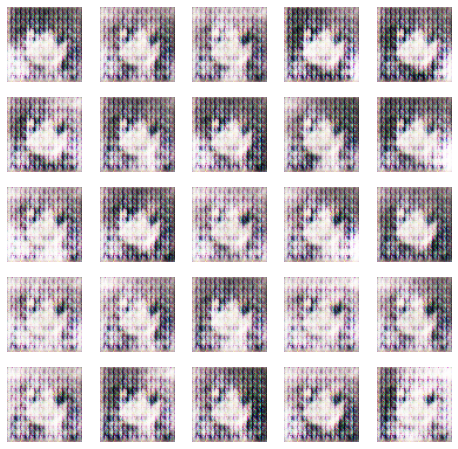

674/674 [==============================] - 594s 882ms/step - d_loss: 0.2695 - g_loss: 2.9536
Epoch 2/10
674/674 [==============================] - ETA: 0s - d_loss: 0.6071 - g_loss: 1.5353

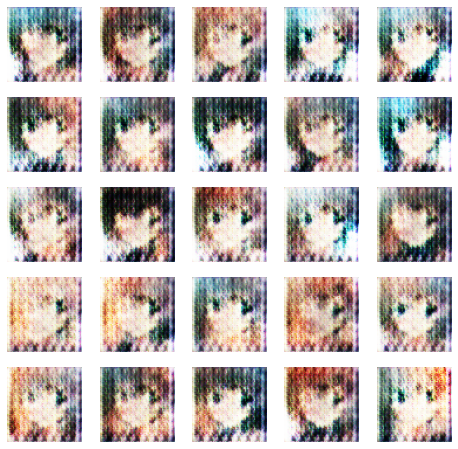

674/674 [==============================] - 1312s 2s/step - d_loss: 0.6071 - g_loss: 1.5353
Epoch 3/10
674/674 [==============================] - ETA: 0s - d_loss: 0.6171 - g_loss: 1.5721

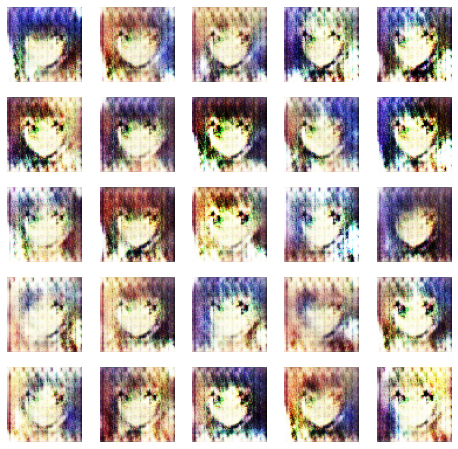

674/674 [==============================] - 763s 1s/step - d_loss: 0.6171 - g_loss: 1.5721
Epoch 4/10
674/674 [==============================] - ETA: 0s - d_loss: 0.6247 - g_loss: 1.6351

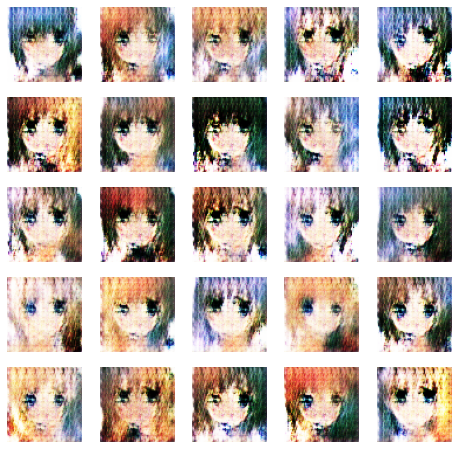

674/674 [==============================] - 789s 1s/step - d_loss: 0.6247 - g_loss: 1.6351
Epoch 5/10
674/674 [==============================] - ETA: 0s - d_loss: 0.6328 - g_loss: 1.6207

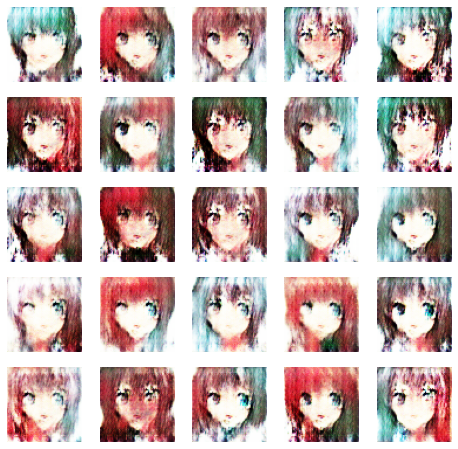

674/674 [==============================] - 780s 1s/step - d_loss: 0.6328 - g_loss: 1.6207
Epoch 6/10
674/674 [==============================] - ETA: 0s - d_loss: 0.5992 - g_loss: 1.5890

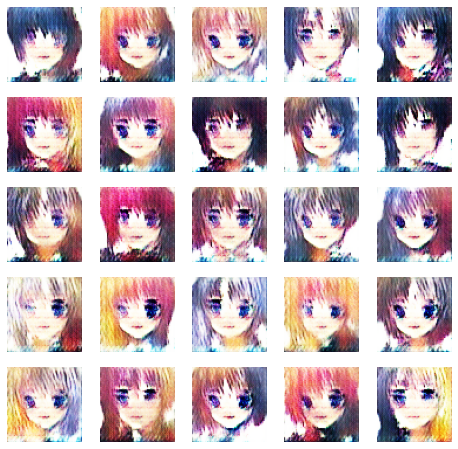

674/674 [==============================] - 748s 1s/step - d_loss: 0.5992 - g_loss: 1.5890
Epoch 7/10
674/674 [==============================] - ETA: 0s - d_loss: 0.6090 - g_loss: 1.4856

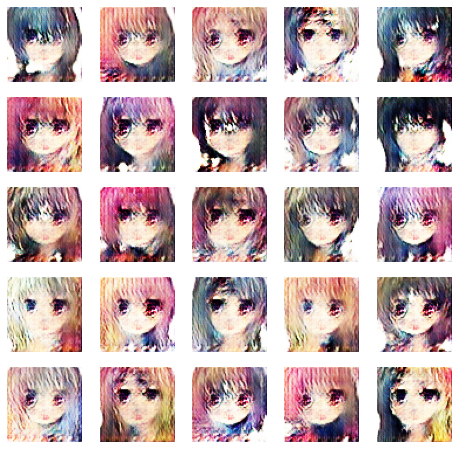

674/674 [==============================] - 692s 1s/step - d_loss: 0.6090 - g_loss: 1.4856
Epoch 8/10
674/674 [==============================] - ETA: 0s - d_loss: 0.5726 - g_loss: 1.5100

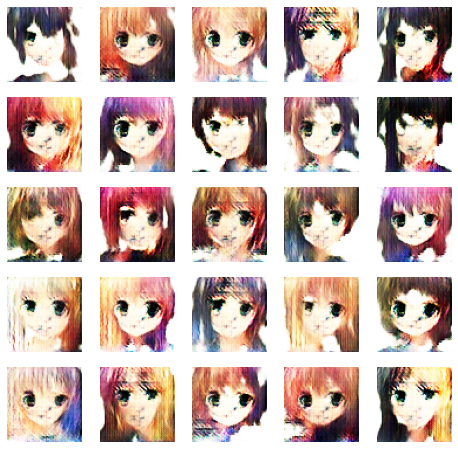

674/674 [==============================] - 524s 778ms/step - d_loss: 0.5726 - g_loss: 1.5100
Epoch 9/10
674/674 [==============================] - ETA: 0s - d_loss: 0.5763 - g_loss: 1.4755

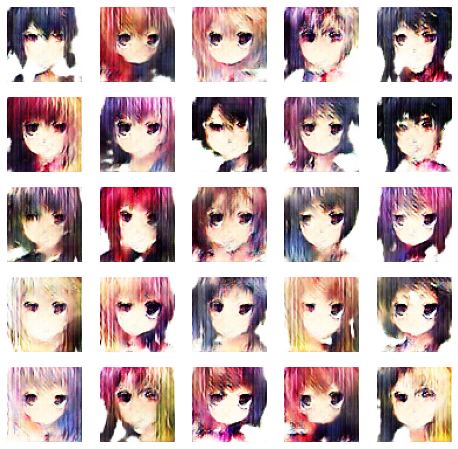

674/674 [==============================] - 640s 949ms/step - d_loss: 0.5763 - g_loss: 1.4755
Epoch 10/10
674/674 [==============================] - ETA: 0s - d_loss: 0.6449 - g_loss: 1.2315

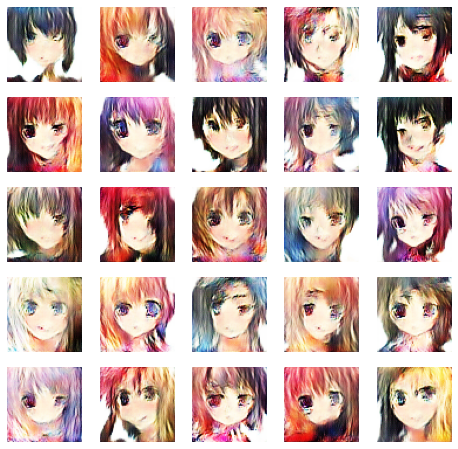

674/674 [==============================] - 684s 1s/step - d_loss: 0.6449 - g_loss: 1.2315


In [38]:
N_EPOCHS = 10
dcgan.fit(train_images, epochs=N_EPOCHS, callbacks=[DCGANMonitor()])

In [45]:
generator1 = load_model('generator1.h5')
discriminator1 = load_model('discriminator1.h5')
dcgan1 = DCGAN(generator=generator1, discriminator=discriminator1, latent_dim=LATENT_DIM)
dcgan1.compile(g_optimizer=Adam(learning_rate=G_LR, beta_1=0.5), d_optimizer=Adam(learning_rate=D_LR, beta_1=0.5), loss_fn=BinaryCrossentropy())

Epoch 1/5
674/674 [==============================] - ETA: 0s - d_loss: 0.7241 - g_loss: 1.0126

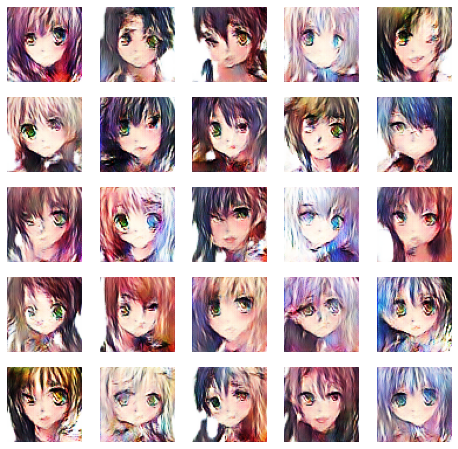

674/674 [==============================] - 1209s 2s/step - d_loss: 0.7241 - g_loss: 1.0126
Epoch 2/5
674/674 [==============================] - ETA: 0s - d_loss: 0.7228 - g_loss: 0.9216

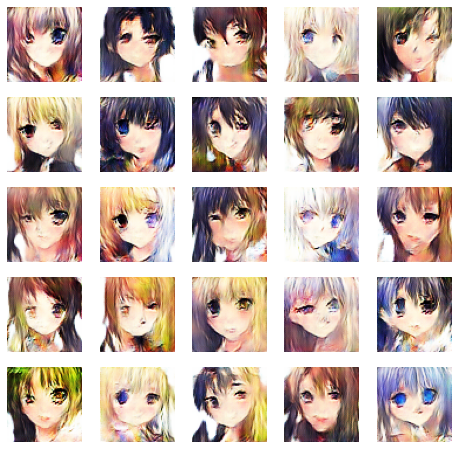

674/674 [==============================] - 703s 1s/step - d_loss: 0.7228 - g_loss: 0.9216
Epoch 3/5
674/674 [==============================] - ETA: 0s - d_loss: 0.7131 - g_loss: 0.8777

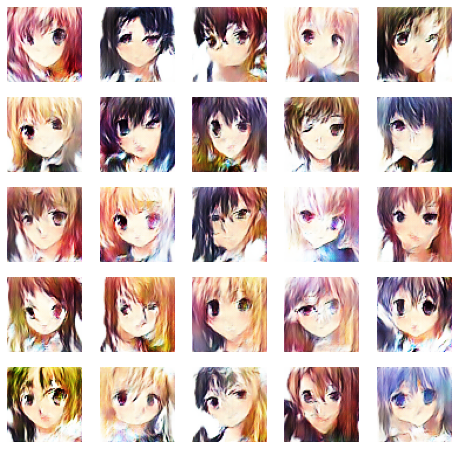

674/674 [==============================] - 564s 836ms/step - d_loss: 0.7131 - g_loss: 0.8777
Epoch 4/5
674/674 [==============================] - ETA: 0s - d_loss: 0.7100 - g_loss: 0.8578

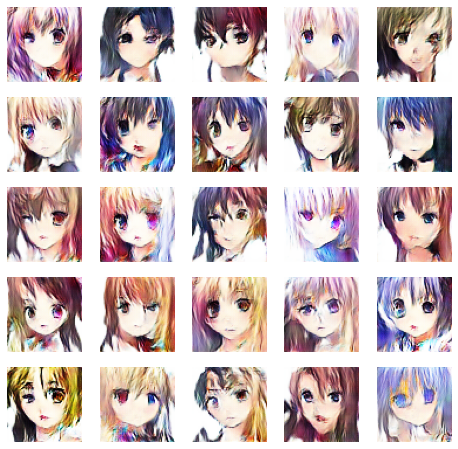

674/674 [==============================] - 561s 832ms/step - d_loss: 0.7100 - g_loss: 0.8578
Epoch 5/5
674/674 [==============================] - ETA: 0s - d_loss: 0.7066 - g_loss: 0.8277

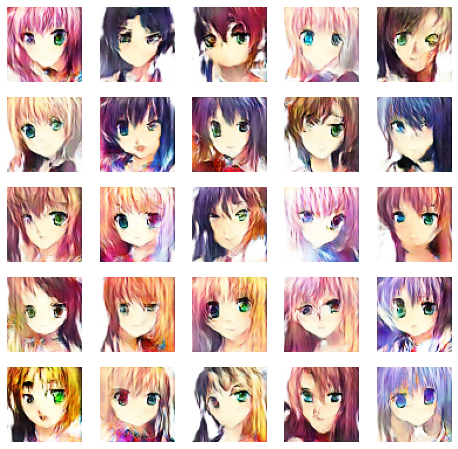

674/674 [==============================] - 540s 801ms/step - d_loss: 0.7066 - g_loss: 0.8277


In [46]:
N_EPOCHS = 5
dcgan1.fit(train_images, epochs=N_EPOCHS, callbacks=[DCGANMonitor()])

In [47]:
discriminator.save('discriminator.h5')

Epoch 1/10
674/674 [==============================] - ETA: 0s - d_loss: 0.9276 - g_loss: 0.6030

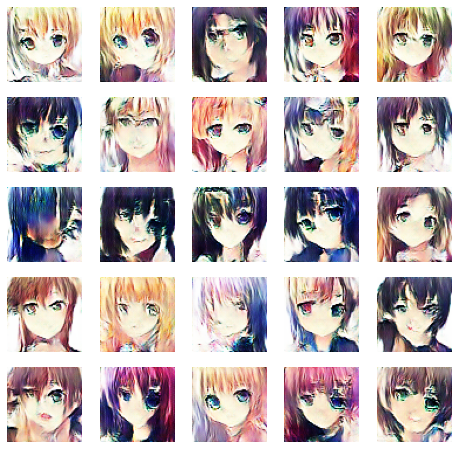

674/674 [==============================] - 588s 867ms/step - d_loss: 0.9276 - g_loss: 0.6030
Epoch 2/10
674/674 [==============================] - ETA: 0s - d_loss: 0.7632 - g_loss: 0.6917

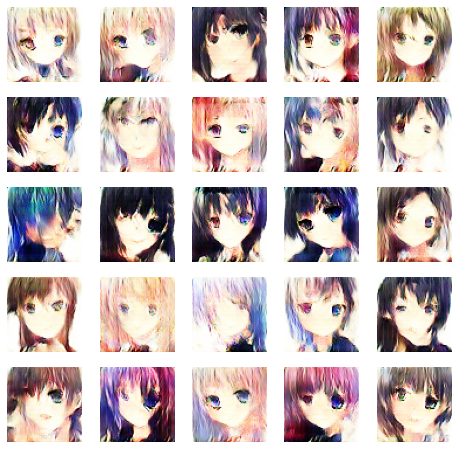

674/674 [==============================] - 920s 1s/step - d_loss: 0.7632 - g_loss: 0.6917
Epoch 3/10
674/674 [==============================] - ETA: 0s - d_loss: 0.7372 - g_loss: 0.7082

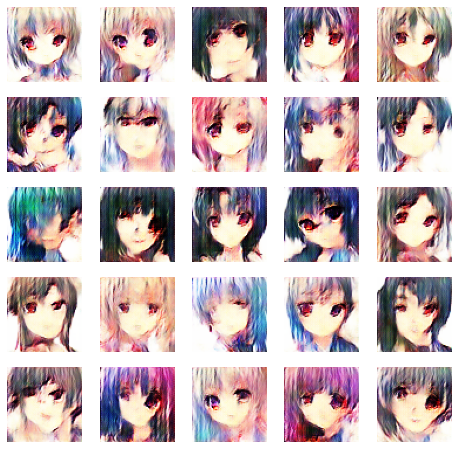

674/674 [==============================] - 868s 1s/step - d_loss: 0.7372 - g_loss: 0.7082
Epoch 4/10
 41/674 [>.............................] - ETA: 26:38 - d_loss: 0.7342 - g_loss: 0.7004

KeyboardInterrupt: 

In [48]:
generator1 = load_model('generator1.h5')
discriminator1 = load_model('discriminator1.h5')
dcgan1 = DCGAN(generator=generator1, discriminator=discriminator1, latent_dim=LATENT_DIM)
dcgan1.compile(g_optimizer=Adam(learning_rate=G_LR, beta_1=0.5), d_optimizer=Adam(learning_rate=D_LR, beta_1=0.5), loss_fn=BinaryCrossentropy())
N_EPOCHS = 10
dcgan1.fit(train_images, epochs=N_EPOCHS, callbacks=[DCGANMonitor()])